#**Step 1: Download data**

In [1]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
from termcolor import colored
from datetime import datetime,date
import shutil
import matplotlib.pyplot as plt
import seaborn as sns
import math
import plotly.express as px
import os
import glob

In [2]:
def get_topic_page(url):
    response = requests.get(url)
    #Writing the parsed contents into a .html file, inorder to see if all the required data is visible when .html document is viewed  
    if not response.ok:
        print('Status code:', response.status_code)
        raise Exception('Failed to fetch web page' + url)
    
    return BeautifulSoup(response.text)

In [3]:
def crypto_coins_collector(coins_tr_tag, coins_tr_tags):
    td_tags = coins_tr_tag.find_all('td')
    
    if (coins_tr_tags.index(coins_tr_tag))<10:
        td_tag = td_tags[2]
        div_in_td = td_tag.find_all('div', class_='sc-16r8icm-0 sc-1teo54s-1 dNOTPP')
        name2 = div_in_td[0].find_all('p', class_='sc-1eb5slv-0 iworPT')
        name = name2[0].text
        symbol2 = div_in_td[0].find_all('p', class_='sc-1eb5slv-0 gGIpIK coin-item-symbol')
        symbol= symbol2[0].text
        base_url = 'https://coinmarketcap.com'
        url_Cryptocurrency = td_tag.a['href'].strip()
        link_list = url_Cryptocurrency.split('/')
        slugg = link_list[-2]
        URL = base_url + url_Cryptocurrency + "markets/"
    else:    
        coins_td_tags_2= coins_tr_tags[coins_tr_tags.index(coins_tr_tag)].find_all('td')
        span =td_tags[2].a.find_all('span')
        name = span[1].text
        symbol = span[2].text
        base_url = 'https://coinmarketcap.com'
        url_Cryptocurrency = coins_td_tags_2[2].a['href'].strip()
        link_list = url_Cryptocurrency.split('/')
        slugg = link_list[-2]
        URL = base_url + url_Cryptocurrency
    return{
        'crypto_name' : name,
        'crypto_sign': symbol, 
        'slugg': slugg,
        'market_URL':URL
        }

In [4]:
# top "n" coins >> n is from [1,99]
def top_n_crypto_coins(url, n):    
    coins_web_page = get_topic_page(url)

    coins_tr_tags = coins_web_page.tbody.find_all('tr')
    top_n_crypto = [crypto_coins_collector(coins_tr_tags[i],coins_tr_tags) for i in range(n)]

    headers = list(top_n_crypto[0].keys())
    values = []
    for item in top_n_crypto:
      values_list = []
      for header in headers:
        values_list.append(str(item.get(header, "")))
      values.append(values_list)

    top_n_crypto_df = pd.DataFrame(values, columns=headers)
    top_n_crypto_df = top_n_crypto_df.reset_index(level=0)
    top_n_crypto_df = top_n_crypto_df.rename(columns={"index": "rank"})
    top_n_crypto_df['rank'] = top_n_crypto_df['rank'] + 1
    return top_n_crypto_df

#top_20_crypto_df = top_n_crypto_coins('https://coinmarketcap.com/coins/', 20)
#top_20_crypto_df

In [5]:
def crypto_market_collector(url, n):
  top_n_crypto_df = top_n_crypto_coins(url, n)
  print("Table of top "+str(n)+" crypto coins @", colored(datetime.utcnow(), 'blue'))
  display(top_n_crypto_df)
  all_df = pd.DataFrame()
  print()
  for i in range(20):
    slug = top_n_crypto_df['slugg'].iloc[i]
    market_URL = top_n_crypto_df['market_URL'].iloc[i]
    crypto_name = top_n_crypto_df['crypto_name'].iloc[i]
    print('Collecting ',colored(crypto_name, 'blue'),' market data @',colored(datetime.utcnow(), 'blue'))
    headers = {
        'authority': 'api.coinmarketcap.com',
        'sec-ch-ua': '"Google Chrome";v="93", " Not;A Brand";v="99", "Chromium";v="93"',
        'accept': 'application/json, text/plain, */*',
        'dnt': '1',
        'sec-ch-ua-mobile': '?0',
        'user-agent': 'Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/93.0.4577.82 Safari/537.36',
        'sec-ch-ua-platform': '"Linux"',
        'origin': 'https://coinmarketcap.com',
        'sec-fetch-site': 'same-site',
        'sec-fetch-mode': 'cors',
        'sec-fetch-dest': 'empty',
        'referer': 'https://coinmarketcap.com/',
        'accept-language': 'en-IN,en-GB;q=0.9,en-US;q=0.8,en;q=0.7,mr;q=0.6',
    }


    params = (
        ('slug', slug),
        ('start', '1'),
        ('limit', '100'),
        ('category', 'spot'),
        ('sort', 'cmc_rank_advanced'),
    )

    response = requests.get('https://api.coinmarketcap.com/data-api/v3/cryptocurrency/market-pairs/latest', headers=headers, params=params)
    #print(response.text)
    df = pd.json_normalize(response.json()['data']['marketPairs'])
    inc = 100
    while True:
        params = (
        ('slug', slug),
        ('start', f'{inc}'),
        ('limit', '100'),
        ('category', 'spot'),
        ('sort', 'cmc_rank_advanced'),
        )

        response = requests.get('https://api.coinmarketcap.com/data-api/v3/cryptocurrency/market-pairs/latest', headers=headers, params=params)

        if response.json()['data']['marketPairs'] == []:
            break

        df = df.append(response.json()['data']['marketPairs'],ignore_index=True)
        inc+=100
    df.insert(loc=0, column='slug', value= slug)
    #url = "https://coinmarketcap.com/currencies/bitcoin/markets/"
    payload={}
    headers = {}
    response_vol = requests.request("GET", market_URL, headers=headers, data=payload)
    soup = BeautifulSoup(response_vol.content,'html5lib')
    stats = soup.find_all('div',{'class':'statsValue'})
    Volume_24_h = int([i.text for i in stats][2][1:].replace(',',''))
    df['Volume %'] = (df['volumeUsd'] / Volume_24_h) * 100
    all_df = all_df.append(df)
  req_df = all_df[["slug", "exchangeName", "marketPair", "price", "depthUsdPositiveTwo", "depthUsdNegativeTwo", "volumeUsd","Volume %", "effectiveLiquidity", "lastUpdated"]]
  req_df = req_df.rename(columns={"exchangeName": "Source", "marketPair": "Pairs", "price":"Price", "depthUsdPositiveTwo":"+2% Depth",
                                "depthUsdNegativeTwo":"-2% Depth", "volumeUsd": "Volume", "effectiveLiquidity": "Liquidity",
                                "lastUpdated":"Updated"})
  req_df = req_df.reset_index(drop=True)
  print()
  print("Collected markets data from top "+str(n)+" coins")
  req_df = req_df.rename(columns={"Source":"Exchange", "Pairs": "Symbol"})
  req_df['Base'], req_df['Quote'] = req_df['Symbol'].str.split('/', 1).str
  req_df = req_df[['slug', 'Exchange', 'Symbol','Base', 'Quote', 'Price', '+2% Depth', '-2% Depth','Volume', 'Volume %', 'Liquidity', 'Updated']]

  display(req_df)
  return top_n_crypto_df, req_df

n = 20
url = "https://coinmarketcap.com/coins/"

data_Fetched_date = datetime.utcnow().strftime("%Y-%m-%d")

top_20_crypto_df, market_df = crypto_market_collector(url,n)


Table of top 20 crypto coins @ 2021-10-10 17:16:49.490271


,rank,crypto_name,crypto_sign,slugg,market_URL
0,1,Bitcoin,BTC,bitcoin,https://coinmarketcap.com/currencies/bitcoin/m...
1,2,Ethereum,ETH,ethereum,https://coinmarketcap.com/currencies/ethereum/...
2,3,Cardano,ADA,cardano,https://coinmarketcap.com/currencies/cardano/m...
3,4,Binance Coin,BNB,binance-coin,https://coinmarketcap.com/currencies/binance-c...
4,5,XRP,XRP,xrp,https://coinmarketcap.com/currencies/xrp/markets/
5,6,Solana,SOL,solana,https://coinmarketcap.com/currencies/solana/ma...
6,7,Polkadot,DOT,polkadot-new,https://coinmarketcap.com/currencies/polkadot-...
7,8,Dogecoin,DOGE,dogecoin,https://coinmarketcap.com/currencies/dogecoin/...
8,9,Terra,LUNA,terra-luna,https://coinmarketcap.com/currencies/terra-lun...
9,10,Avalanche,AVAX,avalanche,https://coinmarketcap.com/currencies/avalanche...




Collected markets data from top 20 coins


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: FutureWarning:

Columnar iteration over characters will be deprecated in future releases.



,slug,Exchange,Symbol,Base,Quote,Price,+2% Depth,-2% Depth,Volume,Volume %,Liquidity,Updated
0,bitcoin,Binance,BTC/USDT,BTC,USDT,55114.836300,3.328665e+07,2.327382e+07,4.262516e+09,12.077974,900.416848,2021-10-10T17:10:54.000Z
1,bitcoin,Huobi Global,BTC/USDT,BTC,USDT,55106.928262,1.478025e+07,1.006033e+07,6.480545e+08,1.836283,909.035823,2021-10-10T17:10:54.000Z
2,bitcoin,Binance,BTC/BUSD,BTC,BUSD,55116.859001,8.934808e+06,1.578389e+07,5.132076e+08,1.454190,881.558731,2021-10-10T17:10:54.000Z
3,bitcoin,Coinbase Exchange,BTC/USD,BTC,USD,55150.480000,1.311656e+07,2.425173e+07,3.985755e+08,1.129377,0.000003,2021-10-10T17:10:53.000Z
4,bitcoin,FTX,BTC/USD,BTC,USD,55176.000000,3.610343e+07,2.785952e+07,3.801034e+08,1.077035,0.000004,2021-10-10T17:10:53.000Z
...,...,...,...,...,...,...,...,...,...,...,...,...
18439,tron,BITEXBOOK,TRX/ETH,TRX,ETH,0.042139,8.802660e-01,1.540466e+00,2.885920e+01,0.000002,0.000000,2021-10-10T17:15:08.000Z
18440,tron,IndoEx,TRX/ETH,TRX,ETH,0.100456,5.808960e+06,3.302367e+06,2.689929e+07,2.118803,316.321410,2021-10-10T17:15:12.000Z
18441,tron,IndoEx,TRX/USDT,TRX,USDT,0.100845,3.647199e+03,1.441606e+04,7.790789e+06,0.613665,117.061268,2021-10-10T17:15:12.000Z
18442,tron,BitMart,TRX/USDT,TRX,USDT,0.100908,6.169309e+04,3.612824e+03,2.566673e+06,0.202172,123.898131,2021-10-10T17:15:10.000Z


# **Step 2: Visualize**

## Table

In [6]:
pd.set_option('display.float_format', '{:.2E}'.format)
market_table = market_df.assign(rn=market_df.sort_values(['Volume'], ascending=False).groupby(['slug','Symbol']).cumcount() + 1).query('rn < 6').sort_values(['slug','Symbol','Volume'], ascending=[True, False, False])
market_table = market_table.reset_index(drop=True)
#query_1.query('Symbol == "MATIC/USD" and slug == "polygon"')
table = market_table[['Symbol', 'Exchange', 'Volume', 'Volume %', '+2% Depth', '-2% Depth']]
table_title = str(colored("Title:",'red')+" Volume on the selected markets "+colored(data_Fetched_date, 'blue')+" (cmc)")
center_terminal_col = int((shutil.get_terminal_size().columns)*1.5)
print(table_title.center((center_terminal_col)))
print()
pd.set_option('display.max_rows', len(market_table))
table.to_csv('table.csv')
market_table.to_csv("market_table.csv")
display(table)

                        Title: Volume on the selected markets 2021-10-10 (cmc)                        



,Symbol,Exchange,Volume,Volume %,+2% Depth,-2% Depth
0,ALGO/XLM,Stellarterm,0.00E+00,0.00E+00,0.00E+00,0.00E+00
1,ALGO/XBT,Kraken,2.78E+05,1.16E-01,2.39E+05,3.00E+05
2,ALGO/USDT,Binance JEX,5.55E+07,2.31E+01,0.00E+00,0.00E+00
3,ALGO/USDT,Mandala Exchange,4.47E+07,1.87E+01,5.10E+04,9.20E+04
4,ALGO/USDT,Binance,4.37E+07,1.82E+01,5.92E+05,1.19E+06
5,ALGO/USDT,OKEx,2.57E+07,1.07E+01,2.19E+05,4.31E+05
6,ALGO/USDT,Bitrue,2.41E+07,1.01E+01,5.24E+04,6.33E+04
7,ALGO/USDC,Crypto.com Exchange,2.41E+05,1.01E-01,6.80E+05,5.80E+05
8,ALGO/USDC,CoinJar,2.03E+04,8.44E-03,8.01E+04,1.32E+05
9,ALGO/USD,Coinbase Exchange,3.02E+07,1.26E+01,1.25E+06,1.82E+06


## Plot

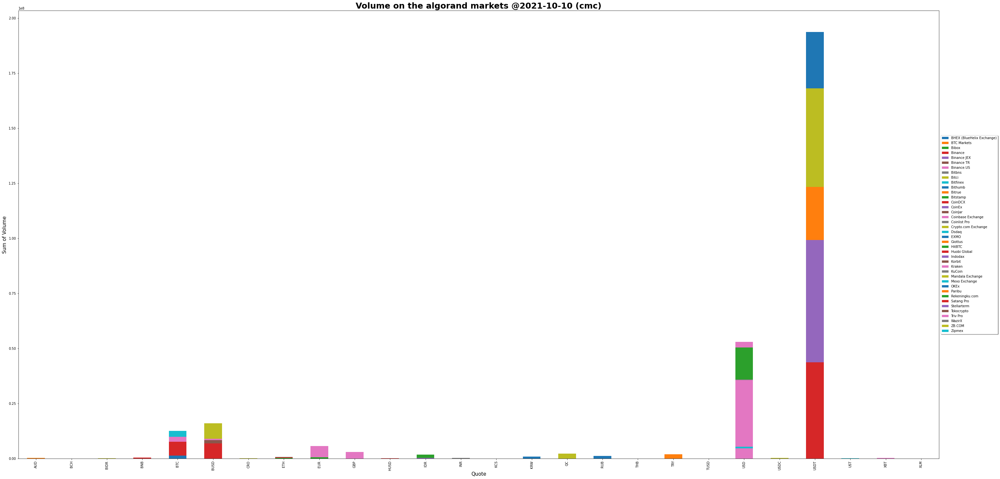

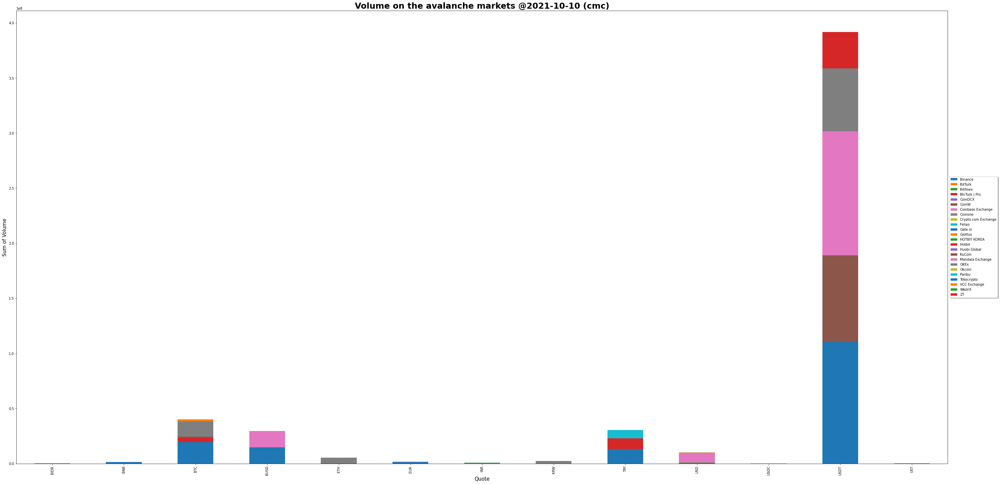

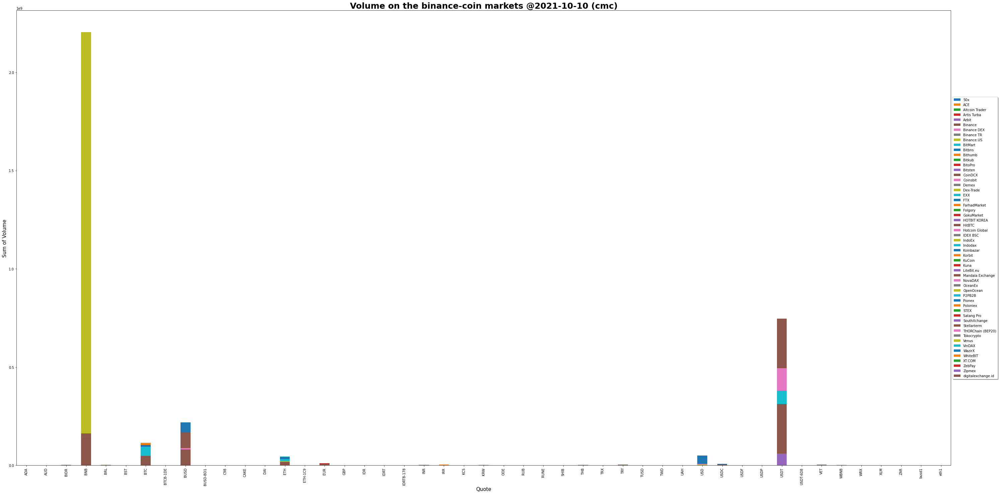

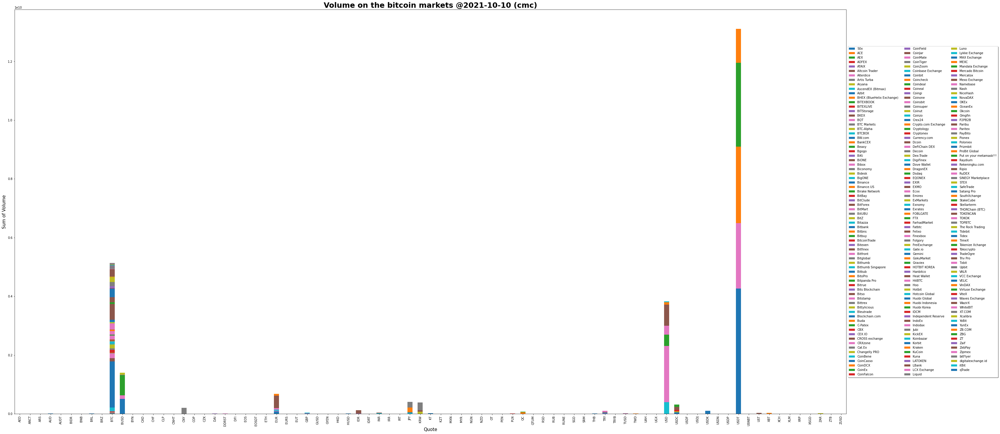

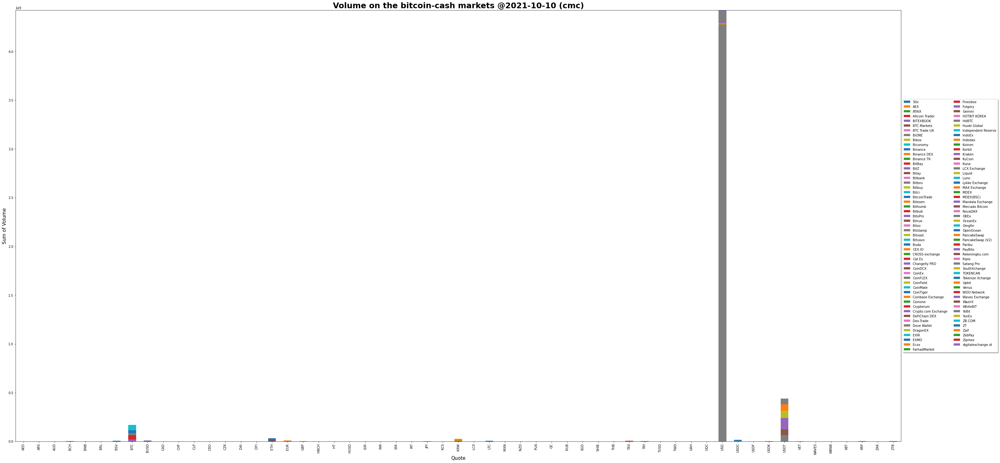

...

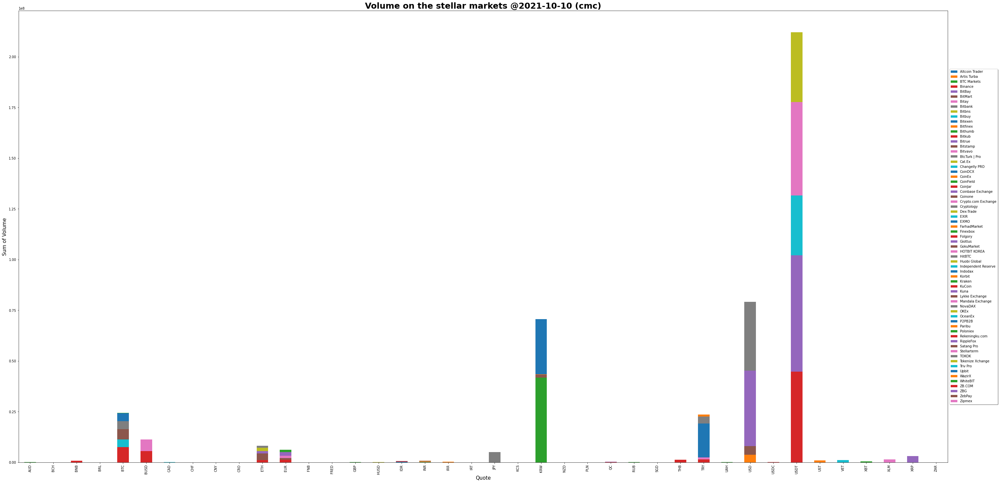

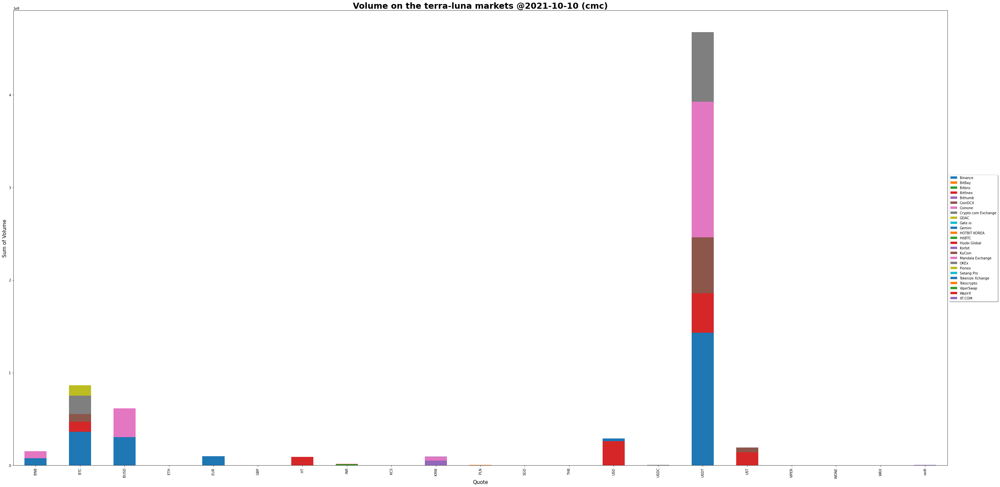

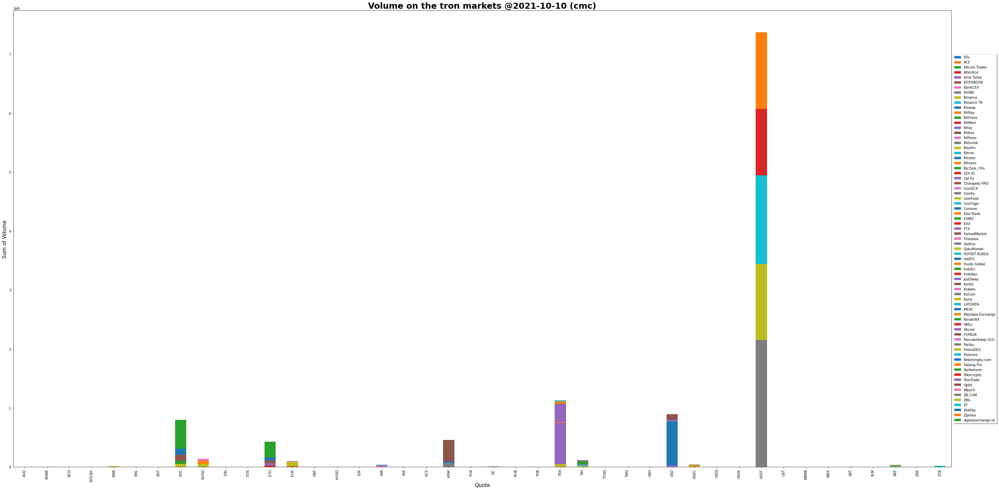

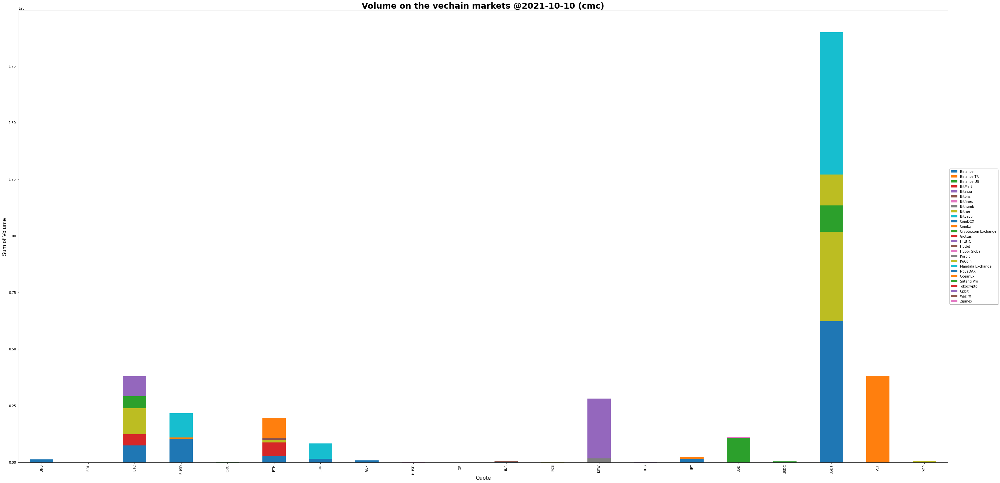

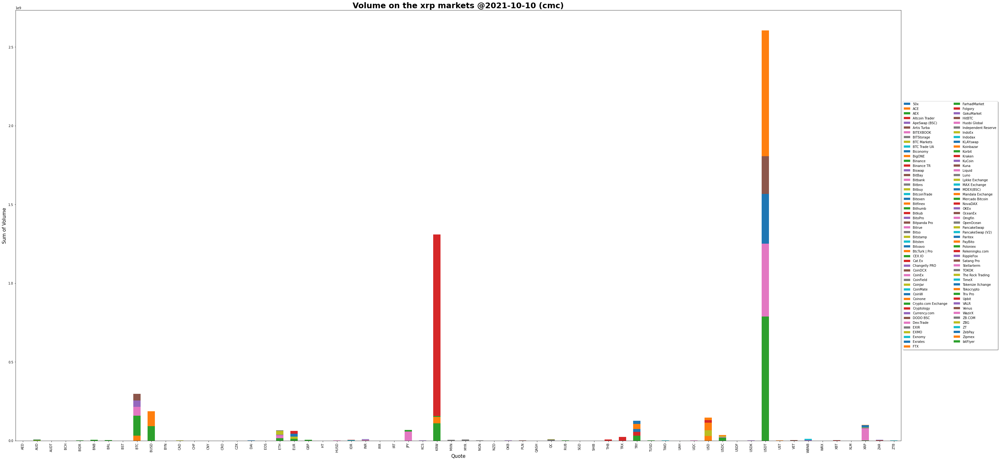

In [7]:
!mkdir /content/Plots/
plot_df = market_table[['slug', 'Exchange', 'Quote', 'Volume']]
slug_list = list(plot_df.slug.unique())
for i in slug_list:
  print()
  temp_plot = plot_df[plot_df['slug'] == i]
  temp_plot = temp_plot[['Exchange', 'Quote', 'Volume']]
  temp_plot=  temp_plot.sort_values(['Exchange','Volume'])
  ncol = int(math.ceil(temp_plot.Exchange.nunique()/100))
  temp_plot_sum = temp_plot.groupby(['Exchange', 'Quote'])['Volume'].agg('sum').reset_index().pivot(columns='Exchange', index='Quote', values='Volume')
  
  ax = temp_plot_sum.plot(kind='bar', stacked=True, figsize=(50,25)) #22 15
  bar_plot_title = "Volume on the "+i+" markets @"+data_Fetched_date+" (cmc)"
  ax.set_title(bar_plot_title, fontweight='bold',fontsize = 25)
  ax.set_xlabel("Quote", fontsize = 15)
  ax.set_ylabel("Sum of Volume", fontsize = 15)
  ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), fancybox=True, shadow=True, ncol=ncol)
  ax.plot()
  ax.figure.savefig("/content/Plots/"+i+"_markets.png", bbox_inches="tight")


In [8]:
import glob
cwd = str(os.getcwd())
plots_path = cwd+"/Plots/*.png"
plots_list = glob.glob(plots_path)
ax = []
fig = plt.figure(figsize=(400, 200))
fig.suptitle("Volume on the selected markets @"+ data_Fetched_date + "(cmc)", fontweight='bold',fontsize = 100)  # set title
for i in range(len(plots_list)):
    img = plt.imread(plots_list[i])
    ax.append(fig.add_subplot(5, 4, i+1))
    plt.imshow(img)
plt.show()
fig.savefig("/content/Plots/All_markets.png")

## Interactive HTML Plots

In [12]:
!mkdir /content/Interactive_Plots/
iplot_df = market_table[['slug', 'Exchange', 'Quote', 'Volume']]
slug_list = list(iplot_df.slug.unique())
for i in slug_list:
  print()
  temp_iplot = iplot_df[iplot_df['slug'] == i]
  temp_iplot = temp_iplot[['Exchange', 'Quote', 'Volume']]
  temp_iplot =  temp_iplot.sort_values(['Exchange','Volume'])
  temp_iplot_sum = temp_iplot.groupby(['Exchange', 'Quote'])['Volume'].agg('sum').reset_index()
  
  fig = px.bar(temp_iplot_sum, x="Quote", y="Volume", color="Exchange", barmode="stack", width=2500, height=1000)
  bar_iplot_title = "Volume on the "+i+" markets @"+data_Fetched_date+" (cmc)"
  fig.update_layout(
    title = bar_iplot_title,
    xaxis_title="Quote",
    yaxis_title="Sum of Volume",
    legend=dict(orientation="h",y=-0.2,))
  fig.show()
  fig.write_html("/content/Interactive_Plots/"+i+"_markets.html")


mkdir: cannot create directory ‘/content/Interactive_Plots/’: File exists



# Saving project to google drive

In [13]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [23]:
%cp -r /content/Interactive_Plots/* /content/drive/MyDrive/Vinter/Interactive_Plots/
%cp -r /content/Plots/* /content/drive/MyDrive/Vinter/Plots/
%cp /content/* /content/drive/MyDrive/Vinter/

cp: -r not specified; omitting directory '/content/drive'
cp: -r not specified; omitting directory '/content/Interactive_Plots'
cp: -r not specified; omitting directory '/content/Plots'
cp: -r not specified; omitting directory '/content/sample_data'
